In [28]:
pip install pydub

In [29]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')
from IPython.display import Audio
from scipy.io import wavfile
from scipy.fft import fft, ifft
from scipy.signal.windows import hamming, hann
from pydub import AudioSegment
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import WhiteKernel, RBF

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [30]:
filename = '/content/drive/MyDrive/piano_sample.mp3'
singlenote = '/content/drive/MyDrive/middlec.mp3'
ent = '/content/drive/MyDrive/audio.mp3'

input = singlenote

y, sr = librosa.load(input, sr=None)
harmonic, percussive = librosa.effects.hpss(y)

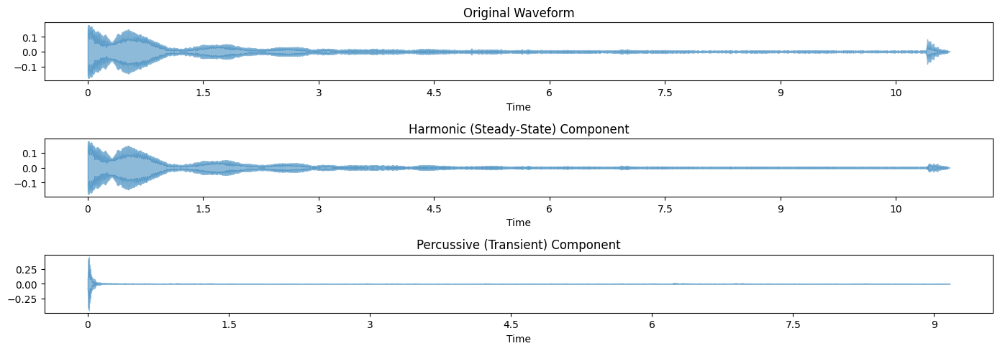

In [ ]:
plt.figure(figsize=(14, 5))

plt.subplot(3, 1, 1)
librosa.display.waveshow(y[120000:1000000], sr=sr, alpha=0.5)
plt.title('Original Waveform')

plt.subplot(3, 1, 2)
librosa.display.waveshow(harmonic[120000:1000000], sr=sr, alpha=0.5)
plt.title('Harmonic (Steady-State) Component')

plt.subplot(3, 1, 3)
librosa.display.waveshow(percussive[60000:500000], sr=sr, alpha=0.5)
plt.title('Percussive (Transient) Component')

plt.tight_layout()
plt.show()

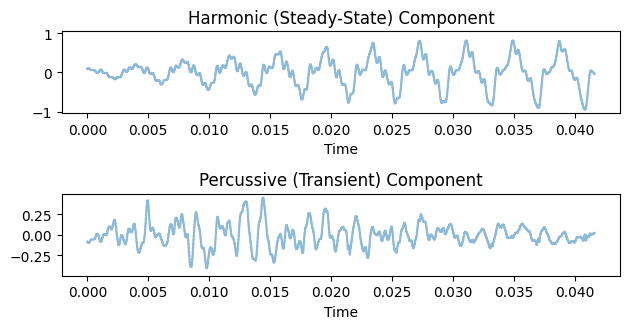

In [ ]:
plt.subplot(3, 1, 3)
librosa.display.waveshow(percussive[60000:62000], sr=sr, alpha=0.5)
plt.title('Percussive (Transient) Component')

plt.subplot(3, 1, 2)
librosa.display.waveshow(harmonic[60000:62000], sr=sr, alpha=0.5)
plt.title('Harmonic (Steady-State) Component')

plt.tight_layout()
plt.show()

In [ ]:
Audio(data=harmonic, rate=sr)

In [ ]:
Audio(data=percussive, rate=sr)

- Implement median filter to separate transient and ss
- Reading to understand the LMLs and GPs in general
- Spectrogram representation


**WEEK 2**

In [ ]:
# @title
D_original = librosa.stft(y)
D_harmonic = librosa.stft(harmonic)
D_percussive = librosa.stft(percussive)

D_original_db = librosa.amplitude_to_db(np.abs(D_original), ref=np.max)
D_harmonic_db = librosa.amplitude_to_db(np.abs(D_harmonic), ref=np.max)
D_percussive_db = librosa.amplitude_to_db(np.abs(D_percussive), ref=np.max)

plt.figure(figsize=(12, 12))

plt.subplot(3, 1, 1)
librosa.display.specshow(D_original_db, sr=sr, x_axis="time", y_axis="log")
plt.colorbar(format="%+2.0f dB")
plt.title("Original Audio (Spectrogram)")

plt.subplot(3, 1, 2)
librosa.display.specshow(D_harmonic_db, sr=sr, x_axis="time", y_axis="log")
plt.colorbar(format="%+2.0f dB")
plt.title("Harmonic Component (Spectrogram)")

plt.subplot(3, 1, 3)
librosa.display.specshow(D_percussive_db, sr=sr, x_axis="time", y_axis="log")
plt.colorbar(format="%+2.0f dB")
plt.title("Percussive Component (Spectrogram)")

plt.tight_layout()
plt.show()

In [ ]:
# @title
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, RationalQuadratic, WhiteKernel

onset_frames = librosa.onset.onset_detect(y=y, sr=sr)
onset_times = librosa.frames_to_time(onset_frames, sr=sr)

onset_sample = librosa.time_to_samples(onset_times[0], sr=sr)
window_size = sr // 2
note_audio = y[onset_sample : onset_sample + window_size]

amplitude_envelope = np.abs(librosa.stft(note_audio)).mean(axis=0)

time = np.linspace(0, len(amplitude_envelope) / sr, len(amplitude_envelope))

kernel = RBF(length_scale=0.1) + RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=0.01)

gp = GaussianProcessRegressor(kernel=kernel, alpha=1e-2, n_restarts_optimizer=10)
gp.fit(time.reshape(-1, 1), amplitude_envelope)

time_pred = np.linspace(0, len(amplitude_envelope) / sr, 200).reshape(-1, 1)
amplitude_pred, std_dev = gp.predict(time_pred, return_std=True)

plt.figure(figsize=(10, 6))
plt.plot(time, amplitude_envelope, 'o', label="Observed Amplitude Envelope", markersize=5)
plt.plot(time_pred, amplitude_pred, 'b-', label="GP Predicted Amplitude Envelope")
plt.fill_between(
    time_pred.flatten(),
    amplitude_pred - 1.96 * std_dev,
    amplitude_pred + 1.96 * std_dev,
    color='blue',
    alpha=0.2,
    label="95% Confidence Interval"
)
plt.title("Gaussian Process Model for a Single Note's Transient Response")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.show()


- Deriving the covariance for the tonal part
- Self constructing median filter/looking into tuning the median filtering
- Self constructed filter - running a window in frequency domain and compute the rolling median
- Likelihood functions for tonal and transient parts (basic white noise model for the transients)


**WEEK 4**

In [31]:
from scipy.io import wavfile
from scipy.fft import fft, ifft
from scipy.signal.windows import hamming, hann
from scipy.ndimage import median_filter
from pydub import AudioSegment

In [ ]:
# @title
audio = AudioSegment.from_file('/content/drive/MyDrive/middlec.mp3')
sample_rate = audio.frame_rate
audio_data = np.array(audio.get_array_of_samples())

window_size = 13
half_window = window_size // 2
time_window_size = 1024
hop_size = time_window_size // 2

processed_audio = np.zeros(len(audio_data))

time_hamming_window = hamming(time_window_size)
freq_hamming_window = hamming(window_size)

for start in range(0, len(audio_data) - time_window_size, hop_size):
    segment = audio_data[start:start + time_window_size].astype(np.float64)

    segment *= time_hamming_window

    segment_ft = fft(segment)

    filtered_segment_ft = np.copy(segment_ft)
    for i in range(half_window, len(segment_ft) - half_window):
        windowed_section = segment_ft[i - half_window:i + half_window + 1] * freq_hamming_window
        filtered_segment_ft[i] = np.median(np.abs(windowed_section)) # take care of taking median of complex numbers

    filtered_segment = ifft(filtered_segment_ft).real # reconstruct the original restoring the phase

    processed_audio[start:start + time_window_size] += filtered_segment * time_hamming_window

processed_audio = np.int16(processed_audio / np.max(np.abs(processed_audio)) * 32767)

#compare plots of filtered_segment and segment_ft
#use freq resolution to compute window size

In [ ]:
Audio(data=processed_audio, rate=sample_rate)

**DERIVATION OF COVARIANCE FUNCTION**

The power spectrum $ S(\omega) $ is modeled as a mixture of Gaussians:
$
S(\omega) = \sum_{q=1}^{Q} w_q \sum_{m=1}^{M} \frac{E_m}{2} \left[ \phi(\omega; m \omega_q, \sigma_f) + \phi(\omega; -m \omega_q, \sigma_f) \right]
$

where $ \phi(\omega; m \omega_q, \sigma_f) $ represents a Gaussian centered at $ m \omega_q $ with standard deviation $ \sigma_f $, and $ w_q $ and $ E_m $ are weights.


$
\phi(\omega; m \omega_q, \sigma_f) = \exp \left( -\frac{(\omega - m \omega_q)^2}{2 \sigma_f^2} \right)
$

$
\phi(\omega; -m \omega_q, \sigma_f) = \exp \left( -\frac{(\omega + m \omega_q)^2}{2 \sigma_f^2} \right)
$

To find the time-domain covariance function $ k(\tau) $, we take the IFT of $ S(\omega) $:
$
k(\tau) = \mathcal{F}^{-1} \left( S(\omega) \right)
$

Let's calculate the IFT of each Gaussian term individually.

IFT of $ \phi(\omega; m \omega_q, \sigma_f) $:
   The IFT of a Gaussian in the form $ \exp \left( -\frac{(\omega - m \omega_q)^2}{2 \sigma_f^2} \right) $ is another Gaussian in the time domain with an oscillatory component. Specifically:
   $
   \mathcal{F}^{-1} \left( \exp \left( -\frac{(\omega - m \omega_q)^2}{2 \sigma_f^2} \right) \right) = \exp \left( -2 \pi^2 \sigma_f^2 \tau^2 \right) \cos(2 \pi m f_q \tau)
   $
   where $ f_q = \frac{\omega_q}{2 \pi} $

Similarly:
   $
   \mathcal{F}^{-1} \left( \exp \left( -\frac{(\omega + m \omega_q)^2}{2 \sigma_f^2} \right) \right) = \exp \left( -2 \pi^2 \sigma_f^2 \tau^2 \right) \cos(2 \pi m f_q \tau)
   $

Combining Both Terms:
   $
   \mathcal{F}^{-1} \left( \frac{E_m}{2} \left[ \phi(\omega; m \omega_q, \sigma_f) + \phi(\omega; -m \omega_q, \sigma_f) \right] \right) = E_m \exp \left( -2 \pi^2 \sigma_f^2 \tau^2 \right) \cos(2 \pi m f_q \tau)
   $

Summing Over All Components
    $
    k(\tau) = \sum_{q=1}^{Q} w_q \sum_{m=1}^{M} E_m \exp \left( -2 \pi^2 \sigma_f^2 \tau^2 \right) \cos(2 \pi m f_q \tau)
    $

Factoring Out the Exponential Term
  Factor out the common term $ \exp \left( -2 \pi^2 \sigma_f^2 \tau^2 \right) $, giving the final result:
  $
  k(\tau) = \exp \left( -2 \pi^2 \sigma_f^2 \tau^2 \right) \sum_{q=1}^{Q} w_q \sum_{m=1}^{M} E_m \cos(2 \pi m f_q b_{m, f_q} \tau)
  $


**LOG-LIKELIHOOD FUNCTIONS**


$
\log p(\mathbf{y_{tonal}} | \mathbf{x}, \theta) = -\frac{1}{2} \mathbf{y}^T [K + \sigma_n^2 I]^{-1} \mathbf{y} - \frac{1}{2} \log |K + \sigma_n^2 I| - \frac{\ell}{2} \log(2\pi)
$

$
\log p(y_{percussive} | x, \theta) = -\frac{N}{2} \log (2 \pi \sigma^2_p) - \frac{1}{2 \sigma^2_p} \sum_{i=1}^N y_i^2
$

In [ ]:
# @title
import scipy.ndimage
import librosa.display

y, sr = librosa.load('/content/drive/MyDrive/middlec.mp3')

harmonic_window_length = 31
percussive_window_length = 31

window_type = "hamming"
overlap_ratio = 0.5
n_fft = 2048
hop_length = int(n_fft * (1 - overlap_ratio))
D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, window=window_type)

S = np.abs(D)

harmonic_S = scipy.ndimage.median_filter(S, size=(1, harmonic_window_length))
percussive_S = scipy.ndimage.median_filter(S, size=(percussive_window_length, 1))

mask_harmonic = harmonic_S > percussive_S
mask_percussive = percussive_S >= harmonic_S

D_harmonic = D * mask_harmonic
D_percussive = D * mask_percussive

harmonic = librosa.istft(D_harmonic, hop_length=hop_length, window=window_type)
percussive = librosa.istft(D_percussive, hop_length=hop_length, window=window_type)

plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title("Original Audio Waveform")

plt.subplot(3, 1, 2)
librosa.display.waveshow(harmonic, sr=sr)
plt.title("Harmonic Component")

plt.subplot(3, 1, 3)
librosa.display.waveshow(percussive, sr=sr)
plt.title("Percussive Component")

plt.tight_layout()
plt.show()

In [ ]:
Audio(data=harmonic, rate=sr)

In [ ]:
Audio(data=percussive, rate=sr)

**WEEK 5**

In [ ]:
# @title
audio = AudioSegment.from_file('/content/drive/MyDrive/middlec.mp3')
sample_rate = audio.frame_rate
audio_data = np.array(audio.get_array_of_samples())

window_size = 19
half_window = window_size // 2
time_window_size = 2048
hop_size = time_window_size // 2

processed_audio = np.zeros(len(audio_data))

time_hamming_window = hamming(time_window_size)
freq_hamming_window = hamming(window_size)

for start in range(0, len(audio_data) - time_window_size, hop_size):
    segment = audio_data[start:start + time_window_size].astype(np.float64)

    segment *= time_hamming_window

    segment_ft = fft(segment)

    filtered_segment_ft = np.copy(segment_ft)
    for i in range(half_window, (len(segment_ft)//2)):  # filter till halfway point and then mirror
        windowed_section = segment_ft[i - half_window:i + half_window + 1]

        median_magnitude = np.median(np.abs(windowed_section))
        filtered_segment_ft[i] = median_magnitude * np.exp(1j * np.angle(segment_ft[i]))

    filtered_segment = ifft(filtered_segment_ft).real

    processed_audio[start:start + time_window_size] += filtered_segment * time_hamming_window

    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.plot(np.abs(segment_ft))
    plt.title("Original Frequency Spectrum (Magnitude)")
    plt.xlabel("Frequency Bin")
    plt.ylabel("Magnitude")

    plt.subplot(1, 2, 2)
    plt.plot(np.abs(filtered_segment_ft))
    plt.title("Filtered Frequency Spectrum (Magnitude)")
    plt.xlabel("Frequency Bin")
    plt.ylabel("Magnitude")

    plt.tight_layout()
    plt.show()

processed_audio = np.int16(processed_audio / np.max(np.abs(processed_audio)) * 32767)

#frequency resolution to use the correct window size
#reconstruction of the time domain audio

In [ ]:
Audio(data=processed_audio, rate=sample_rate)

In [ ]:
processed_audio

In [ ]:
# @title
plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.waveshow(processed_audio[600000:700000].astype(np.float64), sr=sr)
plt.title("Transient Audio Waveform")

plt.tight_layout()
plt.show()

**WEEK 6**

In [ ]:
# @title
audio = AudioSegment.from_file('/content/drive/MyDrive/piano_sample.mp3')
sample_rate = audio.frame_rate
audio_data = np.array(audio.get_array_of_samples())
# audio_data = audio_data[0:1000000]

window_size = 19
half_window = window_size // 2
time_window_size = 2048
hop_size = time_window_size // 2

time_hamming_window = hamming(time_window_size)
freq_hamming_window = hamming(window_size)

processed_audio = np.zeros(len(audio_data))

for start in range(0, len(audio_data) - time_window_size, hop_size):
    segment = audio_data[start:start + time_window_size].astype(np.float64)
    segment *= time_hamming_window

    segment_ft = fft(segment)
    n = len(segment_ft)
    half_len = n // 2 + 1

    filtered_segment_ft = np.copy(segment_ft)

    for i in range(half_window, half_len):
        windowed_section = segment_ft[i - half_window:i + half_window + 1]
        median_magnitude = np.median(np.abs(windowed_section))
        filtered_segment_ft[i] = median_magnitude * np.exp(1j * np.angle(segment_ft[i]))

    if n % 2 == 0:  #even-length FFT
        filtered_segment_ft[half_len:] = np.conj(filtered_segment_ft[1:half_len - 1][::-1])
    else:  #odd-length FFT
        filtered_segment_ft[half_len:] = np.conj(filtered_segment_ft[1:half_len][::-1])

    filtered_segment = ifft(filtered_segment_ft).real

    processed_audio[start:start + time_window_size] += filtered_segment * time_hamming_window

processed_audio = np.int16(processed_audio / np.max(np.abs(processed_audio)) * 32767)

In [ ]:
Audio(data=processed_audio, rate=sample_rate*2)

In [ ]:
# @title
audio = AudioSegment.from_file('/content/drive/MyDrive/middlec.mp3')
sample_rate = audio.frame_rate
audio_data = np.array(audio.get_array_of_samples())
audio_data = audio_data[0:1000000]

window_size = 19
half_window = window_size // 2
time_window_size = 2048
hop_size = time_window_size // 2

time_hamming_window = hamming(time_window_size)

processed_audio = np.zeros(len(audio_data))

for start in range(0, len(audio_data) - time_window_size, hop_size):
    segment = audio_data[start:start + time_window_size].astype(np.float64)
    segment *= time_hamming_window

    segment_ft = fft(segment)
    n = len(segment_ft)
    half_len = n // 2 + 1

    filtered_segment_ft = np.copy(segment_ft)

    for i in range(half_window, half_len):
        windowed_section = segment_ft[i - half_window:i + half_window + 1]
        median_magnitude = np.median(np.abs(windowed_section))
        filtered_segment_ft[i] = min(median_magnitude, np.abs(segment_ft[i])) * np.exp(1j * np.angle(segment_ft[i]))

    if n % 2 == 0:  #even-length FFT
        filtered_segment_ft[half_len:] = np.conj(filtered_segment_ft[1:half_len - 1][::-1])
    else:  #odd-length FFT
        filtered_segment_ft[half_len:] = np.conj(filtered_segment_ft[1:half_len][::-1])

    filtered_segment = ifft(filtered_segment_ft).real

    processed_audio[start:start + time_window_size] += filtered_segment * time_hamming_window

processed_audio = np.int16(processed_audio / np.max(np.abs(processed_audio)) * 32767)

In [ ]:
Audio(data=processed_audio, rate=sample_rate*2)

- Progress report
- Runtime fixes
- Presentation slides

- Tuning the separator
- Gaussian process model using the derived likelihood functions
- Making a start on the presentation
- Transient method separation techniques

**WEEK 7**

In [ ]:
# @title
audio = AudioSegment.from_file('/content/drive/MyDrive/audio.mp3')
sample_rate = audio.frame_rate
audio_data = np.array(audio.get_array_of_samples())
audio_data = audio_data[0:500000]

window_size = 19
half_window = window_size // 2
time_window_size = 2048
hop_size = time_window_size

alpha = 0.4

time_hamming_window = hann(time_window_size)

processed_audio = np.zeros(len(audio_data))

for start in range(0, len(audio_data) - time_window_size, hop_size):
    segment = audio_data[start:start + time_window_size].astype(np.float64)
    segment *= time_hamming_window

    segment_ft = fft(segment)
    n = len(segment_ft)
    half_len = n // 2 + 1

    filtered_segment_ft = np.copy(segment_ft)

    for i in range(0, half_len):  # median filtering from the very first element of the FT!
        start_idx = max(0, i - half_window)
        end_idx = i + half_window

        windowed_section = segment_ft[start_idx:end_idx + 1]
        median_magnitude = np.median(np.abs(windowed_section)) * alpha

        filtered_segment_ft[i] = min(median_magnitude, np.abs(segment_ft[i])) * np.exp(1j * np.angle(segment_ft[i]))

        phase = np.angle(filtered_segment_ft)
        randomized_phase = np.random.uniform(-np.pi, np.pi, len(phase))
        filtered_segment_ft = np.abs(filtered_segment_ft) * np.exp(1j * randomized_phase)

    if n % 2 == 0:  #even-length FFT
        filtered_segment_ft[half_len:] = np.conj(filtered_segment_ft[1:half_len - 1][::-1])
    else:  #odd-length FFT
        filtered_segment_ft[half_len:] = np.conj(filtered_segment_ft[1:half_len][::-1])

    filtered_segment = ifft(filtered_segment_ft).real

    processed_audio[start:start + time_window_size] += filtered_segment * time_hamming_window

    frequencies = np.fft.rfftfreq(len(segment_ft), d=1/(sample_rate*2))

    # plt.figure(figsize=(14, 6))

    # # Assuming frequencies, segment_ft, and filtered_segment_ft are already defined
    # # (limiting the display to frequencies below 6000Hz)
    # freq_limit = 6000
    # indices_below_limit = frequencies <= freq_limit

    # # Plot only the relevant portion
    # plt.plot(frequencies[indices_below_limit], np.abs(segment_ft[:len(frequencies)][indices_below_limit]), label="Original Spectrum")
    # plt.plot(frequencies[indices_below_limit], np.abs(filtered_segment_ft[:len(frequencies)][indices_below_limit]), color='r', label="Filtered Spectrum")

    # plt.title("Frequency Spectrum (Magnitude)")
    # plt.xlabel("Frequency (Hz)")
    # plt.ylabel("Magnitude")
    # plt.grid(True, which="both", linestyle='--')
    # plt.xlim(0, freq_limit)  # Limit x-axis to 6000Hz
    # plt.xticks(range(0, freq_limit + 1000, 1000), [f"{x} Hz" for x in range(0, freq_limit + 1000, 1000)])

    # plt.tight_layout()
    # plt.legend()
    # plt.show()

processed_audio = np.int16(processed_audio / np.max(np.abs(processed_audio)) * 32767)

In [ ]:
Audio(data=audio_data, rate=sample_rate*2)

In [ ]:
Audio(data=processed_audio, rate=sample_rate*2)


In [ ]:
# @title
audio = AudioSegment.from_file('/content/drive/MyDrive/audio.mp3')
sample_rate = audio.frame_rate
audio_data = np.array(audio.get_array_of_samples())
audio_data = audio_data

window_size = 19
half_window = window_size // 2
time_window_size = 2048
hop_size = int(time_window_size * 0.5)

alpha = 0.4

time_hamming_window = hann(time_window_size)
randomized_phase = np.random.uniform(-np.pi, np.pi, time_window_size)

processed_audio = np.zeros(len(audio_data))

for start in range(0, len(audio_data) - time_window_size, hop_size):
    segment = audio_data[start:start + time_window_size].astype(np.float64)
    segment *= time_hamming_window

    segment_ft = fft(segment)
    magnitude = np.abs(segment_ft)
    phase = np.angle(segment_ft)

    median_magnitude = alpha * median_filter(magnitude, size=(window_size,))
    filtered_magnitude = np.minimum(median_magnitude, magnitude)

    filtered_segment_ft = filtered_magnitude * np.exp(1j * randomized_phase)

    # freq_bins = np.fft.rfftfreq(time_window_size, d=1 / sample_rate)
    # freq_limit = 6000
    # indices = freq_bins <= freq_limit
    # plt.figure(figsize=(12, 6))
    # plt.plot(freq_bins[indices], magnitude[:len(freq_bins)][indices], label='Original Magnitude', alpha=0.7, color='blue')
    # plt.plot(freq_bins[indices], filtered_magnitude[:len(freq_bins)][indices], label='Filtered Magnitude', alpha=0.7, color='orange')
    # plt.xlabel('Frequency (Hz)')
    # plt.ylabel('Magnitude')
    # plt.title(f"Fourier Transform at Segment {i + 1} (Start Index: {start})")
    # plt.legend()
    # plt.xlim([0, freq_limit])
    # plt.show()

    # if n % 2 == 0:  #even-length FFT
    #     filtered_segment_ft[half_len:] = np.conj(filtered_segment_ft[1:half_len - 1][::-1])
    # else:  #odd-length FFT
    #     filtered_segment_ft[half_len:] = np.conj(filtered_segment_ft[1:half_len][::-1])

    filtered_segment = ifft(filtered_segment_ft).real

    processed_audio[start:start + time_window_size] += filtered_segment * time_hamming_window


processed_audio = np.int16(processed_audio / np.max(np.abs(processed_audio)) * 32767)

In [ ]:
Audio(data=audio_data, rate=sample_rate*2)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
Audio(data=processed_audio, rate=sample_rate*2)

Output hidden; open in https://colab.research.google.com to view.

<ipython-input-14-58b1370a3c10>:13: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


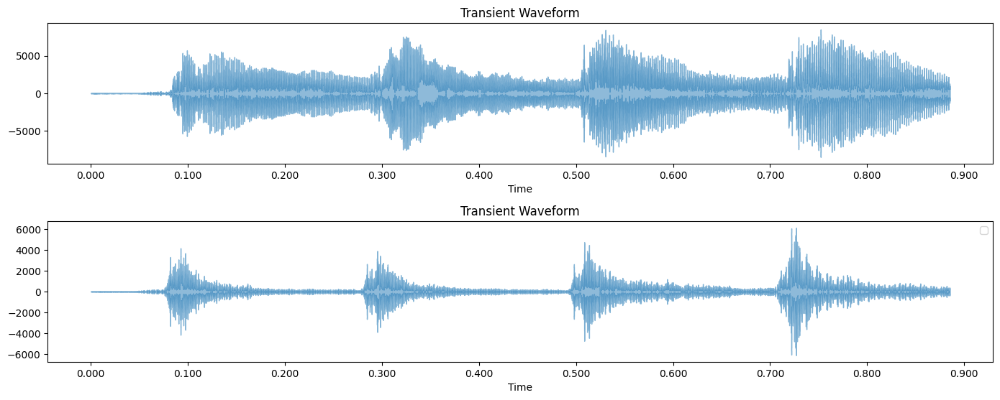

In [ ]:
# @title
plt.figure(figsize=(14, 8))

plt.subplot(3, 1, 1)
librosa.display.waveshow(audio_data.astype(np.float64), sr=sample_rate*2, alpha=0.5)
plt.title('Original Waveform')

plt.subplot(3, 1, 2)
librosa.display.waveshow(processed_audio.astype(np.float64), sr=sample_rate*2, alpha=0.5)
plt.title('Transient Waveform')

plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
# @title
# Parameters for the transient LML
sigma_p2 = 1e1  # Variance of the transient Gaussian noise (adjust as needed)
transient_probabilities = []

print(-0.5 * time_window_size * np.log(2 * np.pi * sigma_p2))

processed = np.zeros(len(audio_data))

for start in range(0, len(audio_data) - time_window_size, hop_size):
    segment = audio_data[start:start + time_window_size].astype(np.float64)
    segment *= time_hamming_window

    segment_ft = fft(segment)
    magnitude = np.abs(segment_ft)
    phase = np.angle(segment_ft)

    median_magnitude = alpha * median_filter(magnitude, size=(window_size,))
    filtered_magnitude = np.minimum(median_magnitude, magnitude)
    filtered_segment_ft = filtered_magnitude * np.exp(1j * randomized_phase)
    filtered_segment = ifft(filtered_segment_ft).real

    # Compute the transient LML for this block
    block_energy = np.sum(filtered_segment ** 2)  # Sum of squared values in the time domain
    lml_transient = (
        -0.5 * time_window_size * np.log(2 * np.pi * sigma_p2)
        - 0.5 * block_energy / sigma_p2
    )
    transient_probabilities.append(lml_transient)

# # Normalize the transient probabilities to get relative likelihoods
# transient_probabilities = np.exp(transient_probabilities - np.max(transient_probabilities))
# transient_probabilities /= np.sum(transient_probabilities)

# Optionally, print or save the transient probabilities for each block
for i, prob in enumerate(transient_probabilities[0:500]):
    print(f"Block {i + 1}: Transient Probability = {prob:.4f}")


**CURRENT PROGRESS**

In [32]:
audio = AudioSegment.from_file('/content/drive/MyDrive/middlec.mp3')
sample_rate = audio.frame_rate
audio_data = np.array(audio.get_array_of_samples())
audio_data = audio_data

time_window_size = 2048
hop_size = int(time_window_size * 0.5)
window_size = 19
alpha = 0.4
sigma_p2 = 1e1

time_hamming_window = hann(time_window_size)
randomized_phase = np.random.uniform(-np.pi, np.pi, time_window_size)
processed_audio = np.zeros(len(audio_data))
transient_probabilities = []

time_hamming_window = hann(time_window_size)
randomized_phase = np.random.uniform(-np.pi, np.pi, time_window_size)

processed_audio = np.zeros(len(audio_data))

for start in range(0, len(audio_data) - time_window_size, hop_size):
    segment = audio_data[start:start + time_window_size].astype(np.float64)
    segment *= time_hamming_window

    segment_ft = fft(segment)
    magnitude = np.abs(segment_ft)
    phase = np.angle(segment_ft)

    median_magnitude = alpha * median_filter(magnitude, size=(window_size,))
    filtered_magnitude = np.minimum(median_magnitude, magnitude)

    filtered_segment_ft = filtered_magnitude * np.exp(1j * randomized_phase)
    filtered_segment = ifft(filtered_segment_ft).real

    # freq_bins = np.fft.rfftfreq(time_window_size, d=1 / sample_rate)
    # freq_limit = 6000
    # indices = freq_bins <= freq_limit
    # plt.figure(figsize=(12, 6))
    # plt.plot(freq_bins[indices], magnitude[:len(freq_bins)][indices], label='Original Magnitude', alpha=0.7, color='blue')
    # plt.plot(freq_bins[indices], filtered_magnitude[:len(freq_bins)][indices], label='Filtered Magnitude', alpha=0.7, color='orange')
    # plt.xlabel('Frequency (Hz)')
    # plt.ylabel('Magnitude')
    # plt.title(f"Fourier Transform at Segment {i + 1} (Start Index: {start})")
    # plt.legend()
    # plt.xlim([0, freq_limit])
    # plt.show()

    processed_audio[start:start + time_window_size] += filtered_segment * time_hamming_window

    # Compute transient LML for this block
    block_energy = np.sum(filtered_segment ** 2)
    lml_transient = (
        -0.5 * time_window_size * np.log(2 * np.pi * sigma_p2)
        - 0.5 * block_energy / sigma_p2
    )
    transient_probabilities.append(lml_transient)


processed_audio = np.int16(processed_audio / np.max(np.abs(processed_audio)) * 32767)

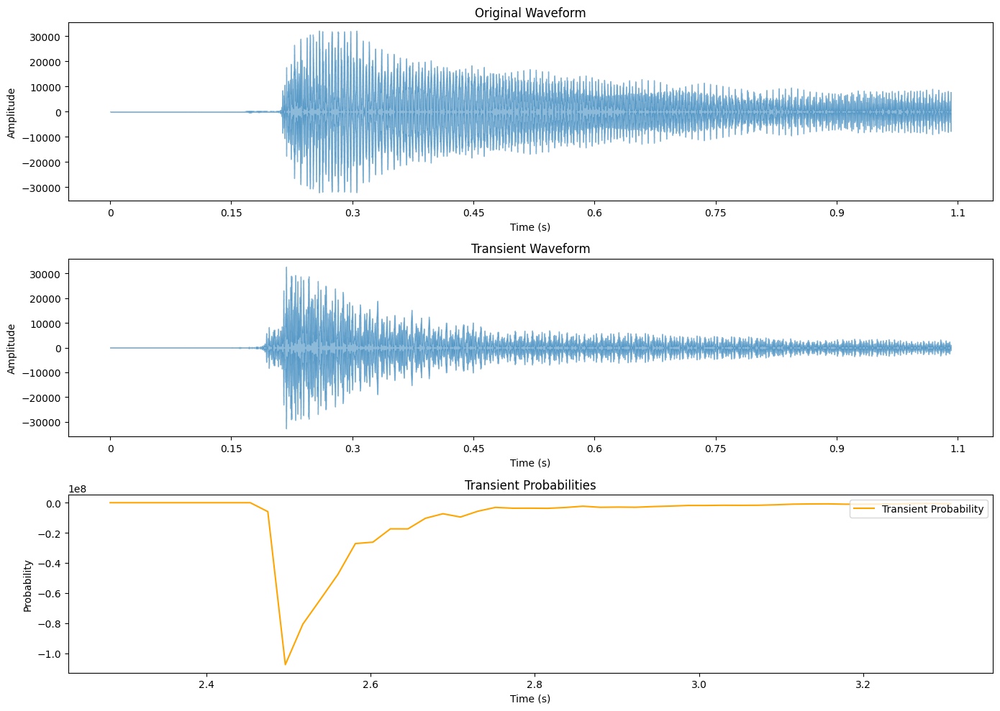

In [44]:
start_sample = 110000
end_sample = 160000
prob_start = int(start_sample / hop_size)
prob_end = int(end_sample / hop_size)

# Plot original waveform, transient waveform, and probabilities
plt.figure(figsize=(14, 10))

# Original waveform
plt.subplot(3, 1, 1)
librosa.display.waveshow(audio_data[start_sample:end_sample].astype(np.float64), sr=sample_rate, alpha=0.5)
plt.title('Original Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Transient waveform
plt.subplot(3, 1, 2)
librosa.display.waveshow(processed_audio[start_sample:end_sample].astype(np.float64), sr=sample_rate, alpha=0.5)
plt.title('Transient Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

# Add transient probabilities
plt.subplot(3, 1, 3)
time_points = np.arange(prob_start, prob_end) * hop_size / sample_rate
plt.plot(time_points, transient_probabilities[prob_start:prob_end], color='orange', label='Transient Probability')
plt.title('Transient Probabilities')
plt.xlabel('Time (s)')
plt.ylabel('Probability')
plt.legend(loc='upper right')

# Adjust layout and display
plt.tight_layout()
plt.show()

In [ ]:
Audio(data=audio_data[start_sample:end_sample], rate=sample_rate)

In [ ]:
Audio(data=processed_audio[start_sample:end_sample], rate=sample_rate*2)

[  40.           42.02111247   44.14434733   46.3748646    48.71808502
   51.17970325   53.76570166   56.4823649    59.3362952    62.33442835
   65.48405061   68.79281639   72.26876686   75.92034951   79.75643863
   83.78635694   88.01989821   92.46735105   97.13952395  102.04777153
  107.20402211  112.62080676  118.31128967  124.28930024  130.5693666
  137.16675097  144.09748673  151.3784174   159.02723757  167.06253589
  175.50384024  184.37166524  193.68756202  203.47417068  213.75527526
  224.55586156  235.90217785  247.82179867  260.34369185  273.49828889
  287.31755893  301.83508644  317.08615285  333.10782228  349.9390316
  367.62068509  386.19575384  405.70938017  426.20898734  447.74439479
  470.36793926  494.13460192  519.10214204  545.33123733  572.8856314
  601.83228871  632.24155726  664.18733962  697.74727245  733.00291524
  770.03994851  808.94838203  849.82277355  892.76245863  937.87179203
  985.26040134 1035.04345337 1087.34193408 1142.28294257 1200.        ] [-114656

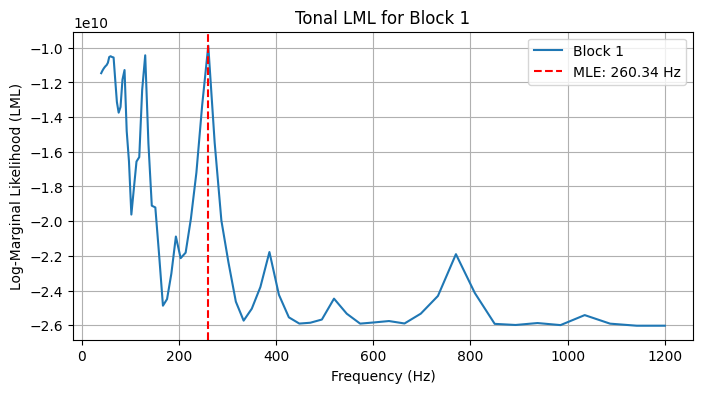

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, ifft
from pydub import AudioSegment
import librosa.display
from scipy.linalg import cho_factor, cho_solve

# Load the audio file
audio = AudioSegment.from_file('/content/drive/MyDrive/middlec.mp3')
sample_rate = audio.frame_rate
audio_data = np.array(audio.get_array_of_samples())
aud = audio_data[121000:125000]

time_window_size = 2048
hop_size = int(time_window_size * 0.5)
sigma_f2 = 2e-5  # Decay parameter for covariance
sigma_n2 = 3  # Noise variance
wq = [1.0]  # Weights for fundamentals
fm = np.logspace(np.log10(20), np.log10(600), 70)
# fm = np.linspace(20, 800, 100)   # Frequency range for MLE
M = 9  # Number of harmonics

# Initialize variables
T = 0.5
v = 2.37

# Define E_m as a function of T and v
def harmonic_weight(m, T, v):
    return 1 / (1 + T * m**v)

# Define covariance function k(tau)
def covariance_function(tau, wq, fm, T, v):
    Q = len(wq)
    cov = np.exp(-2 * np.pi**2 * sigma_f2 * tau**2)
    for q, fq in enumerate(fm):
        harmonic_sum = 0
        for m in range(1, M + 1):
            E_m = harmonic_weight(m, T, v)
            harmonic_sum += E_m * np.cos(2 * np.pi * m * fq * tau)
        cov += wq[q] * harmonic_sum
    return cov

# Compute covariance matrix K using vectorization
def compute_covariance_matrix(t, wq, fm, T, v):
    tau = t[:, None] - t[None, :]
    cov = np.exp(-2 * np.pi**2 * sigma_f2 * tau**2)
    for q, fq in enumerate(fm):
        harmonic_sum = 0
        for m in range(1, M + 1):
            E_m = harmonic_weight(m, T, v)
            harmonic_sum += E_m * np.cos(2 * np.pi * m * fq * tau)
        cov += wq[q] * harmonic_sum
    return cov

# Compute tonal LML using Cholesky factorization
def tonal_LML(y, K, sigma_n2):
    N = len(y)
    K_noise = K + sigma_n2 * np.eye(N)
    cho_decomp = cho_factor(K_noise, lower=True)
    alpha = cho_solve(cho_decomp, y)
    log_det = 2 * np.sum(np.log(np.diag(cho_decomp[0])))
    LML = (
        -0.5 * np.dot(y.T, alpha)
        - 0.5 * log_det
        - 0.5 * N * np.log(2 * np.pi)
    )
    return LML

# Process audio with T and v
block_mle_frequencies = []
t = np.linspace(0, time_window_size / sample_rate, time_window_size)
time_hamming_window = hann(time_window_size)

for start in range(0, len(audio_data) - time_window_size, hop_size):
    segment = aud[start:start + time_window_size].astype(np.float64)
    segment *= time_hamming_window

    # Compute LML for each frequency in the range
    lmls = []
    for freq in fm:
        K = compute_covariance_matrix(t, wq, [freq], T, v)
        lmls.append(tonal_LML(segment, K, sigma_n2))

    # Find the frequency with the maximum LML
    max_lml_index = np.argmax(lmls)
    max_lml_frequency = fm[max_lml_index] * 2
    block_mle_frequencies.append(max_lml_frequency)

    print((fm*2), lmls)

    # Plot LML for the current block
    plt.figure(figsize=(8, 4))
    plt.plot(fm * 2, lmls, label=f"Block {start // hop_size + 1}")
    plt.axvline(max_lml_frequency, color='red', linestyle='--', label=f"MLE: {max_lml_frequency:.2f} Hz")
    plt.title(f"Tonal LML for Block {start // hop_size + 1}")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Log-Marginal Likelihood (LML)")
    plt.legend()
    plt.grid()
    plt.show()

# Plot MLE frequencies over time
plt.figure(figsize=(10, 6))
time_points = np.arange(len(block_mle_frequencies)) * hop_size / sample_rate
plt.plot(time_points, block_mle_frequencies, label="MLE Frequency", color='blue')
plt.title("MLE Frequency for Each Block")
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.legend()
plt.grid()
plt.show()

In [ ]:
# @title
import librosa
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import WhiteKernel, RBF, RationalQuadratic

# Assume processed_audio is the audio signal (numpy array) with sample_rate as the sample rate
sample_rate = 44100  # Adjust this if different
onset_frames = librosa.onset.onset_detect(y=processed_audio.astype(np.float64), sr=sample_rate)
onset_times = librosa.frames_to_time(onset_frames, sr=sample_rate)

# Select the first five onsets
first_five_onsets = onset_frames[:5]

# Extract segments around the first five onsets
window_size = 700  # 0.1-second window around each onset
onset_segments = []

for onset in first_five_onsets:
    start = max(0, onset * 512 - window_size // 2)
    end = min(len(processed_audio), onset * 512 + window_size // 2)
    onset_segments.append(processed_audio[start:end])

# Fit a GP model to each onset segment
kernel = WhiteKernel(noise_level=100) + RationalQuadratic(length_scale=1, alpha=0.5)

for i, segment in enumerate(onset_segments):
    # Generate time points for the segment
    duration = len(segment) / sample_rate
    time_points = np.linspace(0, duration, len(segment)).reshape(-1, 1)

    # Fit Gaussian Process
    gp = GaussianProcessRegressor(kernel=kernel, random_state=0)
    gp.fit(time_points, segment)

    # Predict using GP
    time_points_pred = np.linspace(0, duration, len(segment)).reshape(-1, 1)
    waveform_pred, std_pred = gp.predict(time_points_pred, return_std=True)

    # Plot the results
    plt.figure(figsize=(12, 6))  # Create a new figure for each onset
    plt.plot(time_points, segment, 'r.', markersize=2, label="Original Segment")
    plt.plot(time_points_pred, waveform_pred, 'b-', label="GP Prediction")
    plt.fill_between(
        time_points_pred.flatten(),
        waveform_pred - 1.96 * std_pred,
        waveform_pred + 1.96 * std_pred,
        alpha=0.2,
        color="blue",
        label="95% Confidence Interval"
    )
    plt.title(f"Onset {i + 1}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.show()
